In [1]:
%load_ext autoreload
%autoreload 2
from src.models.representation.vae import *
from src.models.representation.vae.vae import RecurrentVaeWithTeacherForcing
from src.models.representation.vae.decoder.recurrent_decoder import LSTMVaeDecoderWithTeacherForcing
from src.dataloader.dataset import PianoRollMidiDataset
from src.dataloader.midi_parser import piano_roll_to_pretty_midi
import pickle
import torch
import IPython
import pretty_midi


In [2]:
dataset: PianoRollMidiDataset = pickle.load(open("data/preprocessed_piano_roll.pkl", "rb"))

dataset.midi_sparse_list = dataset.midi_sparse_list[:len(dataset.midi_sparse_list)//2]

In [3]:
len(dataset)

107268

In [3]:
import numpy as np

print(dataset[0].shape)
# Print all values without ellipsis
np.set_printoptions(threshold=np.inf)
print(dataset[0].numpy())

torch.Size([640, 60])
[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.48818898 0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.     

In [19]:
from scipy.io.wavfile import write
import os
import numpy as np

piano_roll_to_pretty_midi(dataset[0], path="data/test_output.mid")

midi_data = pretty_midi.PrettyMIDI("data/test_output.mid")
audio_data = midi_data.fluidsynth()
write("data/test_output.wav", 44100, audio_data.astype(np.float32))
# os.system("ffmpeg -y -i data/test_output.wav data/test_output.mp3")

IPython.display.Audio("data/test_output.wav")

np.set_printoptions(threshold=np.inf)
print(dataset[0].numpy())

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.48818898 0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.     

In [20]:
print(midi_data.instruments[0].get_piano_roll().T)

[[ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0. 62.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0. 62.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class PrintLayer(nn.Module):
    def __init__(self, layer_name):
        super(PrintLayer, self).__init__()
        self.layer_name = layer_name

    def forward(self, x):
        print(f"Output of {self.layer_name}: {x.shape}")
        return x

class CNNAutoencoder(nn.Module):
    def __init__(self, input_shape=(60, 640), latent_dim=256, print_shapes=False):
        super(CNNAutoencoder, self).__init__()
        
        self.input_shape = input_shape  # (height=pitch, width=time)
        self.latent_dim = latent_dim
        self.print_shapes = print_shapes
        
        ### Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d((2, 2)),  # -> 30x320

            PrintLayer("Conv1 Output") if print_shapes else nn.Identity(),
            
            nn.Conv2d(32, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d((2, 2)),  # -> 15x160

            PrintLayer("Conv2 Output") if print_shapes else nn.Identity(),
            
            nn.Conv2d(64, 128, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d((2, 2)),  # -> 7x80

            PrintLayer("Conv3 Output") if print_shapes else nn.Identity(),
        )
        
        # Obliczenie wymiarów przed warstwą liniową
        self._calculate_fc_dim()
        
        # Warstwy liniowe
        self.fc1 = nn.Linear(self.fc_dim, latent_dim)
        self.fc2 = nn.Linear(latent_dim, self.fc_dim)
        
        ### Decoder
        self.decoder = nn.Sequential(
            nn.Upsample(size=(160, 15), mode='nearest'),
            nn.Conv2d(128, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            PrintLayer("Decoder Upsample 1 Output") if print_shapes else nn.Identity(),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(64, 32, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm2d(32),
            nn.ReLU(),

            PrintLayer("Decoder Upsample 2 Output") if print_shapes else nn.Identity(),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(32, 1, kernel_size=9, stride=1, padding=4),
            nn.Sigmoid(),

            PrintLayer("Decoder Output") if print_shapes else nn.Identity(),
        )

    def _calculate_fc_dim(self):
        with torch.no_grad():
            dummy_input = torch.zeros(1, 1, *self.input_shape)
            dummy_output = self.encoder(dummy_input)
            self.fc_dim = dummy_output.numel() // dummy_output.shape[0]

    def encode(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)
        x = self.fc1(x)
        return x

    def decode(self, z):
        z = self.fc2(z)
        z = z.view(z.size(0), 128, 80, 7)
        z = self.decoder(z)
        return z

    def forward(self, x):
        z = self.encode(x)
        x_recon = self.decode(z)
        return x_recon


In [30]:
input_shape = (640, 60)
latent_dim = 256
    

model = CNNAutoencoder(input_shape, latent_dim, print_shapes=True)
print(model)

# Losowy tensor wejściowy (batch_size=1, channels=1, height=60, width=640)
x = torch.rand(1, 1, 640, 60)
x_recon = model(x)
print("Input shape:", x.shape)
print("Output shape:", x_recon.shape)  # Powinno być takie samo jak wejście

Output of Conv1 Output: torch.Size([1, 32, 320, 30])
Output of Conv2 Output: torch.Size([1, 64, 160, 15])
Output of Conv3 Output: torch.Size([1, 128, 80, 7])
CNNAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (4): PrintLayer()
    (5): Conv2d(32, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
    (6): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU()
    (8): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (9): PrintLayer()
    (10): Conv2d(64, 128, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
    (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU()
    (13): MaxPool2d(kerne

In [4]:
from torch.utils.data import DataLoader

midi_dataloader = DataLoader(
    dataset,
    batch_size=64,
    pin_memory=True,
    num_workers=0,
    shuffle=True,
)

# model.cuda()
# for batch in midi_dataloader:
#     print("Batch shape:", batch.shape)
#     print("shape 2:", batch.unsqueeze(1).shape)
#     batch = batch.cuda()
#     x_recon = model(batch.unsqueeze(1))
#     print("Reconstructed shape:", x_recon.shape)
#     break

In [5]:
torch.cuda.empty_cache()

In [ ]:
# def min_threshold_loss(y_true, y_pred, min_val=0.016, penalty_strength=10.0):
#     """
#     Penalizes predictions < min_val ONLY when the true value > min_val.
#     Uses a steep sigmoid to approximate hard threshold while keeping gradients.
#     """
#     # 1. Identify locations where true value is significant (above min_val)
#     significant_mask = torch.sigmoid((y_true - min_val) * 100)  # ≈1 when y_true > min_val
    
#     # 2. Penalty term: grows exponentially when predictions fall below min_val
#     penalty = torch.exp(-penalty_strength * (y_pred / min_val))
    
#     # 3. Apply penalty only to significant regions
#     loss = significant_mask * penalty
    
#     return loss.mean()

# # tar = torch.tensor([0.1, 0.5, 0.3])
# # rec = torch.tensor([0, 0.001, 0.1])

# # print(min_threshold_loss(tar, rec, min_val=0.016, penalty_strength=10.0))

tensor(0.5117)


In [18]:
class CNNAutocoderLoss(nn.Module):
    def __init__(self):
        super(CNNAutocoderLoss, self).__init__()

    def mse_loss(self, x, x_recon):
        return F.mse_loss(x_recon * 127, x * 127)
    
    def binary_cross_entropy_loss(self, x, x_recon):
        """Binary cross entropy loss for the model."""
        binary_x = (x > 0.01).float()
        # binary_x_recon = (x_recon > 0.1).float()
        # Clamp x_recon to [0, 1] to avoid out-of-range values for BCE loss
        x_recon = torch.clamp(x_recon, 0, 1)
        return F.binary_cross_entropy(x_recon, binary_x, reduction='mean')
    
    # def binary_penalty_loss(self, x, x_recon):
    #     """Penalty for model giving 0s where it should be non zero pitch value, or vice versa."""
    #     binary_x = (x > 0.1).float()
    #     binary_x_recon = (x_recon > 0.1).float()
    #     penalty = F.binary_cross_entropy(binary_x_recon, binary_x, reduction='none')
    #     return penalty.mean()

    def min_threshold_loss(self, y_true, y_pred, min_val=1/127, penalty_strength=10.0):
        """
        :y_true: Ground truth tensor (original piano roll)
        :y_pred: Predicted tensor (reconstructed piano roll)
        :min_val: Minimum valid value for pitch activation
        :penalty_strength: Strength of the penalty for predictions below min_val

        Penalizes predictions < min_val ONLY when the true value > min_val.
        Uses a steep sigmoid to approximate hard threshold while keeping gradients.
        """
        # 1. Identify locations where true value is significant (above min_val)
        significant_mask = torch.sigmoid((y_true - min_val) * 100)  # ≈1 when y_true > min_val
        
        # 2. Penalty term: grows exponentially when predictions fall below min_val
        penalty = torch.exp(-penalty_strength * (y_pred / min_val))
        
        # 3. Apply penalty only to significant regions
        loss = significant_mask * penalty
        
        return loss.mean()
    
    def forward(self, x, x_recon):
        mse = self.mse_loss(x, x_recon)
        # penalty = self.binary_penalty_loss(x, x_recon)
        # return mse + penalty, mse, penalty
        # bce = self.binary_cross_entropy_loss(x, x_recon)
        penalty = 100 * self.min_threshold_loss(x, x_recon, min_val=0.016, penalty_strength=10.0)
        return mse + penalty, mse, penalty


In [16]:
from tqdm import tqdm

def train_ae(model, dataloader, epochs=10, lr=1e-3, patience=3):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # device = "cpu"
    print(f"Using device: {device}")
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    # criterion = nn.MSELoss()
    criterion = CNNAutocoderLoss()

    best_loss = float('inf')
    epochs_no_improve = 0
    best_model_state = None

    for epoch in range(epochs):
        model.train()
        total_loss = 0.0
        total_mse_loss = 0.0
        total_penalty_loss = 0.0

        iter_batch = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}", unit="batch", leave=False)
        for batch in iter_batch:
            batch = batch.to(device)
            batch = batch.unsqueeze(1)  # Add channel dimension
            optimizer.zero_grad()
            outputs = model(batch)
            loss, mse_loss, penalty_loss = criterion(outputs, batch)
            loss.backward()
            optimizer.step()
            # print(loss)
            # print(loss.item())
            total_loss += loss.item()
            total_mse_loss += mse_loss.item()
            total_penalty_loss += penalty_loss.item()
            iter_batch.set_postfix(loss=loss.item(), mse_loss=mse_loss.item(), penalty_loss=penalty_loss.item())

        avg_loss = total_loss / len(dataloader)
        avg_mse_loss = total_mse_loss / len(dataloader)
        avg_penalty_loss = total_penalty_loss / len(dataloader)
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}, MSE Loss: {avg_mse_loss:.4f}, Penalty Loss: {avg_penalty_loss:.4f}")
        # print(f"Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}")

        # Early stopping check
        if avg_loss < best_loss:
            best_loss = avg_loss
            epochs_no_improve = 0
            best_model_state = model.state_dict()  # Save best model
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print(f"Early stopping triggered after {epoch+1} epochs.")
                break

    # Restore best model
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print("Best model restored.")

In [20]:
# from src.models.representation.ae.ae_trainer import AeTrainer
import os


model = CNNAutoencoder(input_shape=(60, 640), latent_dim=256).cuda()
# optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
# criterion = nn.MSELoss()

# trainer = AeTrainer(
#     model,
#     optimizer,
#     criterion,
#     "test/simple_cnn_ae",
#     1,
#     use_tqdm=False
# )
# os.environ['CUDA_LAUNCH_BLOCKING'] = "0"

train_ae(model, midi_dataloader, epochs=10, lr=0.0001)
# trainer.train(midi_dataloader, epochs=1)
# trainer.save("test/simple_vae_final.pth")

# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print(f"Using device: {device}")
# model.to(device)
# optimizer = torch.optim.Adam(model.parameters(), lr=0.003)
# criterion = nn.MSELoss()

# model.train()
# total_loss = 0.0

# for batch in midi_dataloader:
#     batch = batch.to(device)
#     outputs = model(batch.unsqueeze(1))
#     print("Reconstructed shape:", x_recon.shape)
#     break

Using device: cuda


Epoch [1/10], Loss: 317.1037, MSE Loss: 276.1457, Penalty Loss: 40.9580


Epoch [2/10], Loss: 185.0864, MSE Loss: 157.2489, Penalty Loss: 27.8375


Epoch [3/10], Loss: 142.9354, MSE Loss: 117.8770, Penalty Loss: 25.0584


Epoch [4/10], Loss: 125.4201, MSE Loss: 102.2851, Penalty Loss: 23.1350


Epoch [5/10], Loss: 115.9078, MSE Loss: 93.9916, Penalty Loss: 21.9162


Epoch [6/10], Loss: 109.8291, MSE Loss: 88.7117, Penalty Loss: 21.1174


Epoch [7/10], Loss: 105.1880, MSE Loss: 84.6491, Penalty Loss: 20.5389


Epoch [8/10], Loss: 101.4562, MSE Loss: 81.3538, Penalty Loss: 20.1024


KeyboardInterrupt: 

In [21]:
torch.save(model, 'data/ae_cnn_v2.pth')

# VAE

In [5]:
class CNNVAE(nn.Module):
    def __init__(self, input_shape=(60, 640), latent_dim=256, print_shapes=False):
        super(CNNVAE, self).__init__()
        
        self.input_shape = input_shape  # (height=pitch, width=time)
        self.latent_dim = latent_dim
        self.print_shapes = print_shapes
        
        ### Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d((2, 2)),  # -> 30x320

            PrintLayer("Conv1 Output") if print_shapes else nn.Identity(),
            
            nn.Conv2d(32, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d((2, 2)),  # -> 15x160

            PrintLayer("Conv2 Output") if print_shapes else nn.Identity(),
            
            nn.Conv2d(64, 128, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d((2, 2)),  # -> 7x80

            PrintLayer("Conv3 Output") if print_shapes else nn.Identity(),
        )
        
        # Calculate dimensions before linear layer
        self._calculate_fc_dim()
        
        # Latent space
        self.fc_mu = nn.Linear(self.fc_dim, latent_dim)
        self.fc_logvar = nn.Linear(self.fc_dim, latent_dim)
        self.fc_decode = nn.Linear(latent_dim, self.fc_dim)
        
        ### Decoder
        self.decoder = nn.Sequential(
            nn.Upsample(size=(160, 15), mode='nearest'),
            nn.Conv2d(128, 64, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm2d(64),
            nn.ReLU(),

            PrintLayer("Decoder Upsample 1 Output") if print_shapes else nn.Identity(),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(64, 32, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm2d(32),
            nn.ReLU(),

            PrintLayer("Decoder Upsample 2 Output") if print_shapes else nn.Identity(),
            
            nn.Upsample(scale_factor=2, mode='nearest'),
            nn.Conv2d(32, 1, kernel_size=9, stride=1, padding=4),
            nn.Sigmoid(),

            PrintLayer("Decoder Output") if print_shapes else nn.Identity(),
        )

    def _calculate_fc_dim(self):
        with torch.no_grad():
            dummy_input = torch.zeros(1, 1, *self.input_shape)
            dummy_output = self.encoder(dummy_input)
            self.fc_dim = dummy_output.numel() // dummy_output.shape[0]

    def encode(self, x):
        x = self.encoder(x)
        x = x.view(x.size(0), -1)
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        z = self.fc_decode(z)
        z = z.view(z.size(0), 128, 80, 7)
        z = self.decoder(z)
        return z

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        x_recon = self.decode(z)
        return x_recon, mu, logvar


In [11]:
class CNNVAELoss(nn.Module):
    def __init__(self, beta=1.0):
        super(CNNVAELoss, self).__init__()
        self.beta = beta

    def mse_loss(self, x, x_recon):
        return F.mse_loss(x_recon * 127, x * 127)
    
    def mae_loss(self, x, x_recon):
        return F.l1_loss(x_recon * 127, x * 127)

    def min_threshold_loss(self, y_true, y_pred, min_val=1/127, penalty_strength=10.0):
        significant_mask = torch.sigmoid((y_true - min_val) * 100)
        penalty = torch.exp(-penalty_strength * (y_pred / min_val))
        loss = significant_mask * penalty
        return loss.mean()

    def kl_divergence(self, mu, logvar):
        # KL divergence between N(mu, sigma^2) and N(0, 1)
        return -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=1).mean()
    
    # def binary_penalty_loss(self, x, x_recon):
    #     """Penalty for model giving 0s where it should be non zero pitch value, or vice versa."""
    #     binary_x = (x > 0.1).float()
    #     binary_x_recon = (x_recon > 0.1).float()
    #     penalty = F.binary_cross_entropy(binary_x_recon, binary_x, reduction='none')
    #     return penalty.mean()

    def forward(self, x, x_recon, mu, logvar):
        mse = self.mse_loss(x, x_recon)
        penalty = 100 * self.min_threshold_loss(x, x_recon, min_val=0.016, penalty_strength=10.0)
        kl = self.kl_divergence(mu, logvar)
        total_loss = mse + penalty + self.beta * kl
        # return total_loss, mse, penalty, kl
        # mae = self.mae_loss(x, x_recon)
        # penalty = self.binary_penalty_loss(x, x_recon)
        # total_loss = mse + penalty + self.beta * kl
        return total_loss, mse, penalty, kl


In [13]:
from tqdm import tqdm

def train_vae(model, dataloader, epochs=10, lr=1e-3, patience=3, beta=1.0):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = CNNVAELoss(beta=beta)

    best_loss = float('inf')
    epochs_no_improve = 0
    best_model_state = None

    for epoch in range(epochs):
        model.train()
        total_loss = 0.0
        total_mse_loss = 0.0
        total_penalty_loss = 0.0
        total_kl_loss = 0.0

        iter_batch = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}", unit="batch", leave=False)
        for batch in iter_batch:
            batch = batch.to(device)
            batch = batch.unsqueeze(1)  # Add channel dimension
            optimizer.zero_grad()
            x_recon, mu, logvar = model(batch)
            loss, mse_loss, penalty_loss, kl_loss = criterion(batch, x_recon, mu, logvar)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            total_mse_loss += mse_loss.item()
            total_penalty_loss += penalty_loss.item()
            total_kl_loss += kl_loss.item()
            iter_batch.set_postfix(
                loss=loss.item(),
                mse_loss=mse_loss.item(),
                penalty_loss=penalty_loss.item(),
                kl_loss=kl_loss.item()
            )

        avg_loss = total_loss / len(dataloader)
        avg_mse_loss = total_mse_loss / len(dataloader)
        avg_penalty_loss = total_penalty_loss / len(dataloader)
        avg_kl_loss = total_kl_loss / len(dataloader)
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}, MSE: {avg_mse_loss:.4f}, Penalty: {avg_penalty_loss:.4f}, KL: {avg_kl_loss:.4f}")

        # Early stopping check
        if avg_loss < best_loss:
            best_loss = avg_loss
            epochs_no_improve = 0
            best_model_state = model.state_dict()
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print(f"Early stopping triggered after {epoch+1} epochs.")
                break

    if best_model_state is not None:
        model.load_state_dict(best_model_state)
        print("Best model restored.")

In [16]:
vae_model = CNNVAE(input_shape=(60, 640), latent_dim=256 * 2).cuda()
train_vae(vae_model, midi_dataloader, epochs=10, lr=0.0001, beta=0.1)

Using device: cuda


Epoch [1/10], Loss: 327.9111, MSE: 311.0570, Penalty: 0.0878, KL: 167.6632


Epoch [2/10], Loss: 200.7509, MSE: 173.3457, Penalty: 0.5559, KL: 268.4929


Epoch [3/10], Loss: 147.8578, MSE: 112.0682, Penalty: 1.1861, KL: 346.0352


Epoch [4/10], Loss: 129.7574, MSE: 91.2540, Penalty: 1.3751, KL: 371.2832


Epoch [5/10], Loss: 120.6344, MSE: 80.8828, Penalty: 1.3973, KL: 383.5433


Epoch [6/10], Loss: 114.5875, MSE: 74.2095, Penalty: 1.3572, KL: 390.2076


Epoch [7/10], Loss: 110.6120, MSE: 69.9896, Penalty: 1.2926, KL: 393.2985


Epoch [8/10], Loss: 107.4945, MSE: 66.7803, Penalty: 1.2224, KL: 394.9186


Epoch [9/10], Loss: 105.2871, MSE: 64.6126, Penalty: 1.1687, KL: 395.0585


Epoch [10/10], Loss: 103.5825, MSE: 62.9447, Penalty: 1.1317, KL: 395.0610
Best model restored.


In [18]:
torch.save(vae_model, 'data/vae_cnn_v3.pth')

# Eval

In [19]:
from scipy.io.wavfile import write
import os
import numpy as np

test_idx = 2

piano_roll_to_pretty_midi(dataset[test_idx], path="data/test_original.mid")

midi_data = pretty_midi.PrettyMIDI("data/test_original.mid")
audio_data = midi_data.fluidsynth()
write("data/test_original.wav", 44100, audio_data.astype(np.float32))

midi_data.get_pitch_class_histogram()

Instrument with 34 notes added to PrettyMIDI object.
Instuments in MIDI: ['']


array([0.11764706, 0.        , 0.05882353, 0.05882353, 0.23529412,
       0.        , 0.14705882, 0.14705882, 0.        , 0.11764706,
       0.        , 0.11764706])

In [20]:
model_for_eval = vae_model

model_for_eval.eval()
x = dataset[test_idx].unsqueeze(0).unsqueeze(0).cuda() 
x_recon = model_for_eval(x)

if isinstance(x_recon, tuple):
    x_recon = x_recon[0]

x_recon = x_recon.squeeze(0).squeeze(0).cpu().detach().numpy().astype(np.float32)
x_recon = np.where(x_recon < 0.1, 0, x_recon)

print("Original shape:", dataset[test_idx].shape)
print("Reconstructed shape:", x_recon.shape)
np.set_printoptions(threshold=np.inf)
# print(x_recon)

IPython.display.Audio("data/test_original.wav")


Original shape: torch.Size([640, 60])
Reconstructed shape: (640, 60)


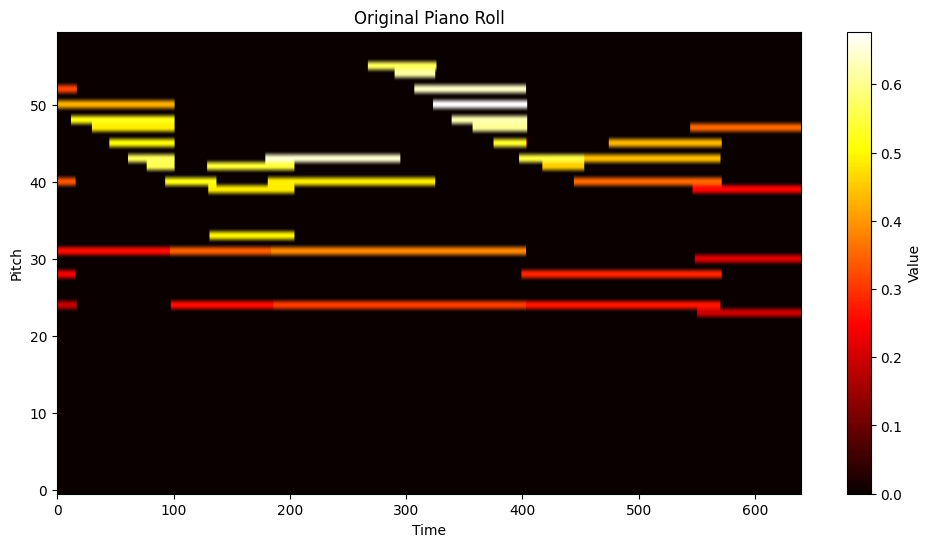

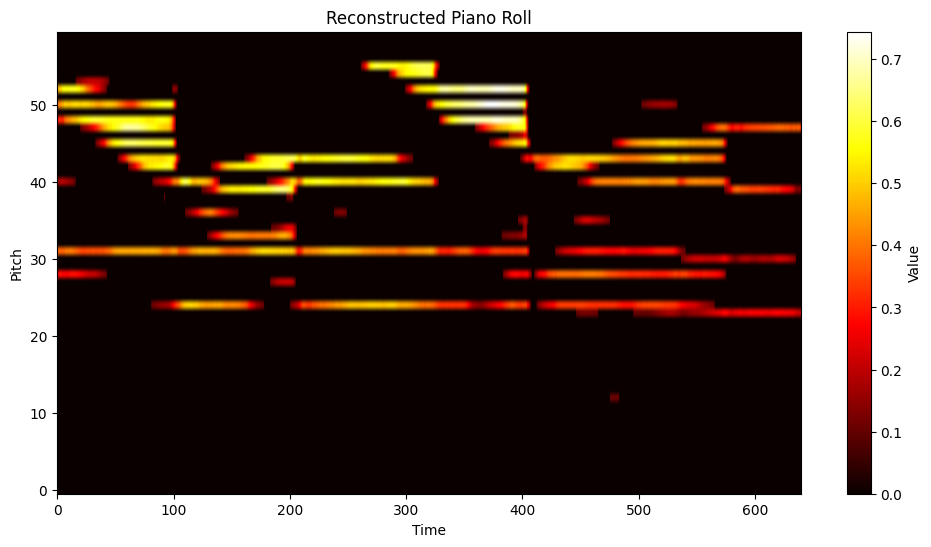

In [21]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.imshow(x.squeeze().cpu().numpy().T, aspect='auto', origin='lower', cmap='hot')
plt.colorbar(label='Value')
plt.title('Original Piano Roll')
plt.xlabel('Time')
plt.ylabel('Pitch')
plt.show()


plt.figure(figsize=(12, 6))
plt.imshow(x_recon.T, aspect='auto', origin='lower', cmap='hot')
plt.colorbar(label='Value')
plt.title('Reconstructed Piano Roll')
plt.xlabel('Time')
plt.ylabel('Pitch')
plt.show()

In [22]:
piano_roll_to_pretty_midi(dataset[test_idx], path="data/test_original.mid")

midi_data = pretty_midi.PrettyMIDI("data/test_original.mid")
for i, instrument in enumerate(midi_data.instruments):
    print(f"Instrument {i}: {len(instrument.notes)} notes")
    for note in instrument.notes[:5]:  # Show first 5 notes
        print(f"  Pitch: {note.pitch}, Start: {note.start}, End: {note.end}, Velocity: {note.velocity}")

Instrument with 34 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
Instrument 0: 34 notes
  Pitch: 52, Start: 0.0, End: 0.25, Velocity: 30
  Pitch: 64, Start: 0.0, End: 0.25, Velocity: 42
  Pitch: 48, Start: 0.0, End: 0.2659090909090909, Velocity: 24
  Pitch: 76, Start: 0.0, End: 0.2659090909090909, Velocity: 40
  Pitch: 66, Start: 1.2022727272727272, End: 1.5772727272727272, Velocity: 71


In [23]:
from src.dataloader.midi_parser import piano_roll_to_pretty_midi

piano_roll_to_pretty_midi(
    torch.tensor(x_recon), 
    path="data/test_recon.mid")

midi_data = pretty_midi.PrettyMIDI("data/test_recon.mid")
print(midi_data.instruments)
for i, instrument in enumerate(midi_data.instruments):
    print(f"Instrument {i}: {len(instrument.notes)} notes")
    for note in instrument.notes[:5]:  # Show first 5 notes
        print(f"  Pitch: {note.pitch}, Start: {note.start}, End: {note.end}, Velocity: {note.velocity}")

Instrument with 56 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
[Instrument(program=0, is_drum=False, name="")]
Instrument 0: 56 notes
  Pitch: 75, Start: 0.0, End: 0.015909090909090907, Velocity: 12
  Pitch: 77, Start: 0.0, End: 0.015909090909090907, Velocity: 15
  Pitch: 64, Start: 0.0, End: 0.25, Velocity: 22
  Pitch: 52, Start: 0.0, End: 0.6727272727272727, Velocity: 34
  Pitch: 76, Start: 0.0, End: 0.6727272727272727, Velocity: 58


In [24]:
piano_roll_to_pretty_midi(
    torch.tensor(x_recon), 
    path="data/test_recon.mid")

midi_data = pretty_midi.PrettyMIDI("data/test_recon.mid")
audio_data = midi_data.fluidsynth()
write("data/test_recon.wav", 44100, audio_data.astype(np.float32))

print(midi_data.get_pitch_class_histogram())

print(f"Size of original audio: {os.path.getsize('data/test_original.wav') / (1024 * 1024):.2f} MB")
print(f"Size of reconstructed audio: {os.path.getsize('data/test_recon.wav') / (1024 * 1024):.2f} MB")

Instrument with 56 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
[0.14285714 0.01785714 0.08928571 0.07142857 0.17857143 0.03571429
 0.08928571 0.10714286 0.         0.08928571 0.05357143 0.125     ]
Size of original audio: 1.85 MB
Size of reconstructed audio: 1.85 MB


In [25]:
IPython.display.Audio("data/test_recon.wav")

107268it [01:46, 1007.36it/s]


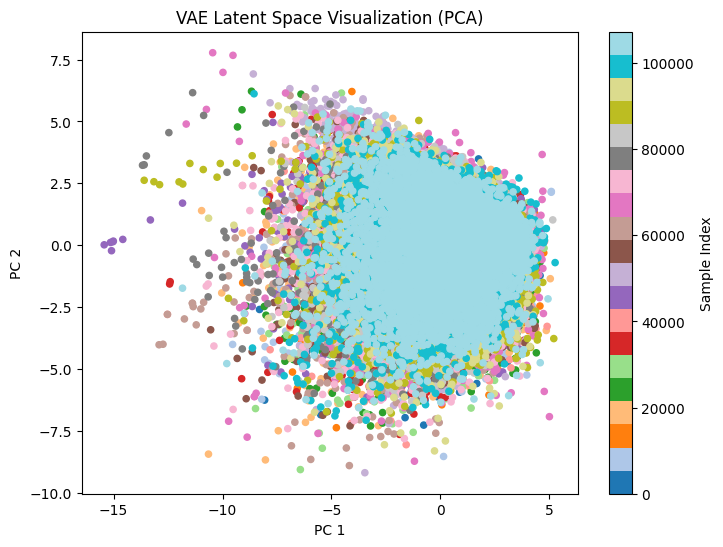

In [28]:
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt

# Collect latent vectors (mu) for the whole dataset
latents = []
labels = []

model_for_eval.eval()
with torch.no_grad():
    for idx, sample in tqdm(enumerate(dataset)):
        sample = sample.unsqueeze(0).unsqueeze(0).cuda()
        mu, logvar = model_for_eval.encode(sample)
        latents.append(mu.squeeze(0).cpu().numpy())
        labels.append(idx)

latents = np.stack(latents)

# Reduce to 2D with PCA
pca = PCA(n_components=2)
latents_2d = pca.fit_transform(latents)

plt.figure(figsize=(8, 6))
plt.scatter(latents_2d[:, 0], latents_2d[:, 1], c=labels, cmap='tab20', s=20)
plt.colorbar(label='Sample Index')
plt.title('VAE Latent Space Visualization (PCA)')
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.show()

# Sample VAE

(640, 60)


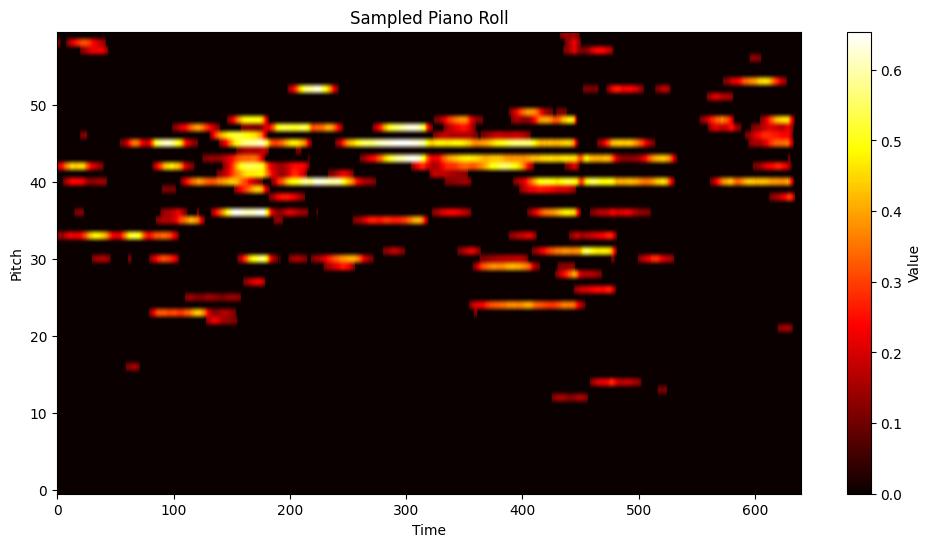

In [37]:
def sample(vae, latent_dim=256, num_samples=1):
    with torch.no_grad():
        z = torch.randn(num_samples, latent_dim).cuda()
        samples = vae.decode(z)
    return samples.cpu()

# Generate and plot samples
midi_sample = sample(vae_model, latent_dim=256*2, num_samples=1)

midi_sample = midi_sample.squeeze(0).squeeze(0).cpu().numpy().astype(np.float32)
midi_sample = np.where(midi_sample < 0.1, 0, midi_sample)

print(midi_sample.shape)

plt.figure(figsize=(12, 6))
plt.imshow(midi_sample.T, aspect='auto', origin='lower', cmap='hot')
plt.colorbar(label='Value')
plt.title('Sampled Piano Roll')
plt.xlabel('Time')
plt.ylabel('Pitch')
plt.show()

In [108]:
np.set_printoptions(threshold=np.inf)
midi_sample = np.where(midi_sample < 0.1, 0, midi_sample)
print(midi_sample)

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.     

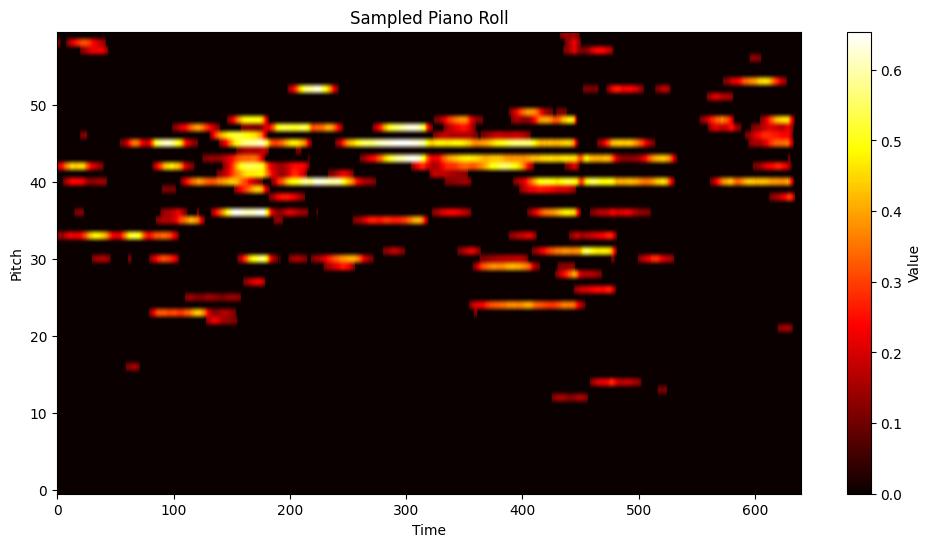

In [38]:
plt.figure(figsize=(12, 6))
plt.imshow(midi_sample.T, aspect='auto', origin='lower', cmap='hot')
plt.colorbar(label='Value')
plt.title('Sampled Piano Roll')
plt.xlabel('Time')
plt.ylabel('Pitch')
plt.show()

In [39]:
piano_roll_to_pretty_midi(
    torch.tensor(midi_sample), 
    path="data/test_sample_vae.mid")

midi_data = pretty_midi.PrettyMIDI("data/test_sample_vae.mid")

for i, instrument in enumerate(midi_data.instruments):
    print(f"Instrument {i}: {len(instrument.notes)} notes")
    for note in instrument.notes[:5]:  # Show first 5 notes
        print(f"  Pitch: {note.pitch}, Start: {note.start}, End: {note.end}, Velocity: {note.velocity}")

audio_data = midi_data.fluidsynth()
write("data/test_sample_vae.wav", 44100, audio_data.astype(np.float32))

IPython.display.Audio("data/test_sample_vae.wav")

Instrument with 109 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
Instrument 0: 109 notes
  Pitch: 64, Start: 0.0, End: 0.015909090909090907, Velocity: 14
  Pitch: 82, Start: 0.0, End: 0.04772727272727272, Velocity: 18
  Pitch: 60, Start: 0.23409090909090907, End: 0.35909090909090907, Velocity: 12
  Pitch: 70, Start: 0.3136363636363636, End: 0.4068181818181818, Velocity: 13
  Pitch: 66, Start: 0.0, End: 0.625, Velocity: 24


# DDIM

In [93]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math
from torch import optim

class DDPM(nn.Module):
    """
    Diffusion Probabilistic Model for MIDI Generation (DPIM)
    Complete version with all required noise schedule parameters
    """
    
    def __init__(self, 
                 latent_dim=256, 
                 num_timesteps=1000,
                 hidden_dims=[512, 1024, 512],
                 dropout=0.1):
        super().__init__()
        
        self.latent_dim = latent_dim
        self.num_timesteps = num_timesteps
        self.hidden_dims = hidden_dims
        
        # Noise schedule - now with all required parameters
        self.register_buffer('betas', self._linear_beta_schedule(num_timesteps))
        self.register_buffer('alphas', 1. - self.betas)
        self.register_buffer('alphas_cumprod', torch.cumprod(self.alphas, dim=0))
        self.register_buffer('alphas_cumprod_prev', F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.))
        self.register_buffer('sqrt_alphas_cumprod', torch.sqrt(self.alphas_cumprod))
        self.register_buffer('sqrt_one_minus_alphas_cumprod', torch.sqrt(1. - self.alphas_cumprod))
        
        # Calculations for posterior q(x_{t-1} | x_t, x_0)
        self.register_buffer('posterior_variance',
            self.betas * (1. - self.alphas_cumprod_prev) / (1. - self.alphas_cumprod))
        
        # Time embedding
        self.time_mlp = nn.Sequential(
            nn.Linear(latent_dim, latent_dim * 4),
            nn.SiLU(),
            nn.Linear(latent_dim * 4, latent_dim)
        )
        
        # Input projection
        self.input_proj = nn.Linear(latent_dim, hidden_dims[0])
        
        # Main network
        self.blocks = nn.ModuleList()
        dims = [hidden_dims[0]] + hidden_dims
        for i in range(len(dims) - 1):
            self.blocks.append(ResBlock(dims[i], dims[i+1], latent_dim, dropout=dropout))
        
        # Output layers
        self.output_norm = nn.LayerNorm(hidden_dims[-1])
        self.output_proj = nn.Linear(hidden_dims[-1], latent_dim)
    
    def _linear_beta_schedule(self, num_timesteps):
        scale = 1000 / num_timesteps
        beta_start = scale * 1e-4
        beta_end = scale * 0.02
        return torch.linspace(beta_start, beta_end, num_timesteps)
    
    def forward(self, x, t):
        # Time embedding
        t_emb = self.time_mlp(timestep_embedding(t, self.latent_dim))
        
        # Project input
        h = self.input_proj(x)
        
        # Process through residual blocks
        for block in self.blocks:
            h = block(h, t_emb)
        
        # Final output
        return self.output_proj(self.output_norm(h))
    
    def q_sample(self, x_start, t, noise=None):
        if noise is None:
            noise = torch.randn_like(x_start)
        
        sqrt_alphas_cumprod_t = extract(self.sqrt_alphas_cumprod, t, x_start.shape)
        sqrt_one_minus_alphas_cumprod_t = extract(self.sqrt_one_minus_alphas_cumprod, t, x_start.shape)
        
        return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise
    
    def p_losses(self, x_start, t, noise=None):
        if noise is None:
            noise = torch.randn_like(x_start)
        
        x_noisy = self.q_sample(x_start=x_start, t=t, noise=noise)
        predicted_noise = self(x_noisy, t)
        
        return F.mse_loss(noise, predicted_noise)
    
    @torch.no_grad()
    def p_sample(self, x, t, t_index):
        betas_t = extract(self.betas, t, x.shape)
        sqrt_one_minus_alphas_cumprod_t = extract(self.sqrt_one_minus_alphas_cumprod, t, x.shape)
        sqrt_recip_alphas_t = extract(torch.sqrt(1.0 / self.alphas), t, x.shape)
        
        # Model prediction
        model_mean = sqrt_recip_alphas_t * (
            x - betas_t * self(x, t) / sqrt_one_minus_alphas_cumprod_t
        )
        
        if t_index == 0:
            return model_mean
        else:
            posterior_variance_t = extract(self.posterior_variance, t, x.shape)
            noise = torch.randn_like(x)
            return model_mean + torch.sqrt(posterior_variance_t) * noise
    
    @torch.no_grad()
    def sample(self, batch_size, device):
        shape = (batch_size, self.latent_dim)
        x = torch.randn(shape, device=device)
        
        for i in reversed(range(0, self.num_timesteps)):
            t = torch.full((batch_size,), i, device=device, dtype=torch.long)
            x = self.p_sample(x, t, i)
        
        return x

class ResBlock(nn.Module):
    def __init__(self, dim_in, dim_out, time_dim, dropout=0.1):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.LayerNorm(dim_in),
            nn.Linear(dim_in, dim_out),
            nn.SiLU(),
            nn.Dropout(dropout),
            nn.LayerNorm(dim_out),
            nn.Linear(dim_out, dim_out),
            nn.Dropout(dropout)
        )
        
        self.time_emb = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_dim, dim_out)
        )
        
        self.residual = nn.Linear(dim_in, dim_out) if dim_in != dim_out else nn.Identity()
    
    def forward(self, x, t):
        h = self.mlp(x)
        h = h + self.time_emb(t)
        return h + self.residual(x)

def timestep_embedding(timesteps, dim, max_period=10000):
    half = dim // 2
    freqs = torch.exp(
        -math.log(max_period) * torch.arange(start=0, end=half, dtype=torch.float32) / half
    ).to(device=timesteps.device)
    args = timesteps[:, None].float() * freqs[None]
    embedding = torch.cat([torch.cos(args), torch.sin(args)], dim=-1)
    if dim % 2:
        embedding = torch.cat([embedding, torch.zeros_like(embedding[:, :1])], dim=-1)
    return embedding

def extract(a, t, x_shape):
    batch_size = t.shape[0]
    out = a.gather(-1, t)
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1)))

In [41]:
midi_dataloader_dpim = DataLoader(
    dataset,
    batch_size=16,
    pin_memory=True,
    num_workers=0,
    shuffle=True,
)

In [ ]:
def run_dpim_training(vae_model, ddpm_model, midi_dataloader_dpim, epochs=10):
    """
    Run DPIM training with the given VAE model and MIDI dataloader.
    """
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    vae_model.eval()

    # Training ddpm_model
    optimizer = optim.Adam(ddpm_model.parameters(), lr=1e-4)

    for epoch in range(epochs):
        ddpm_model.train()
        total_loss = 0.0
        
        iter_batch = tqdm(midi_dataloader_dpim, desc=f"Epoch {epoch+1}/{epochs}", unit="batch", leave=False)
        for batch in iter_batch:
            batch = batch.to(device)
            batch = batch.unsqueeze(1)

        # for batch in tqdm(midi_dataloader_dpim):
        #     batch = batch.to(device)
        #     batch = batch.unsqueeze(1) 
            
            # Encode with VAECNN
            with torch.no_grad():
                mu, logvar = vae_model.encode(batch)
                z = vae_model.reparameterize(mu, logvar)
            
            # Train DPIM
            optimizer.zero_grad()
            
            # Sample random timesteps
            t = torch.randint(0, ddpm_model.num_timesteps, (z.shape[0],), device=device)
        
            # Diffusion loss
            # print(f"z shape: {z.shape}, t shape: {t.shape}")

            loss = ddpm_model.p_losses(z, t)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            iter_batch.set_postfix(loss=loss.item())
        avg_loss = total_loss / len(midi_dataloader_dpim)
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}")

In [110]:
ddpm = DDPM(latent_dim=vae_model.latent_dim).cuda()

run_dpim_training(vae_model, ddpm_model=ddpm, midi_dataloader_dpim=midi_dataloader_dpim, epochs=10)

Epoch [1/10], Loss: 0.6065


Epoch [2/10], Loss: 0.4035


Epoch [3/10], Loss: 0.3442


Epoch [4/10], Loss: 0.3220


Epoch [5/10], Loss: 0.3101


Epoch [6/10], Loss: 0.3026


Epoch [7/10], Loss: 0.2950


Epoch [8/10], Loss: 0.2948


Epoch [9/10], Loss: 0.2908


Epoch [10/10], Loss: 0.2896


Generated piano rolls shape: (16, 640, 60)


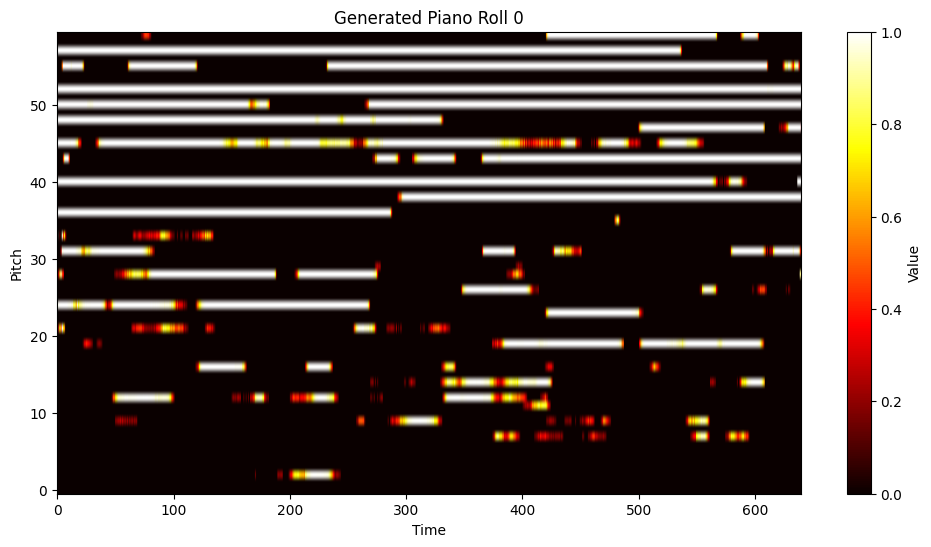

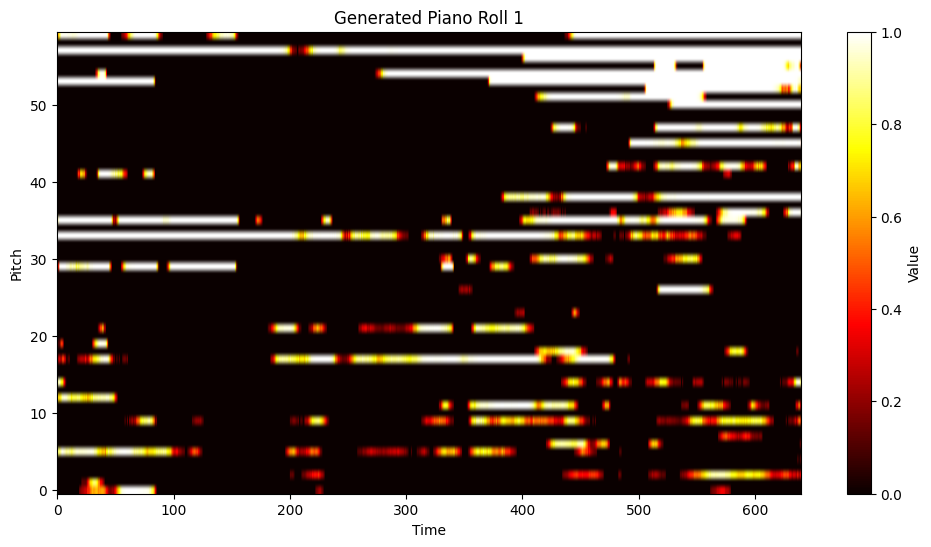

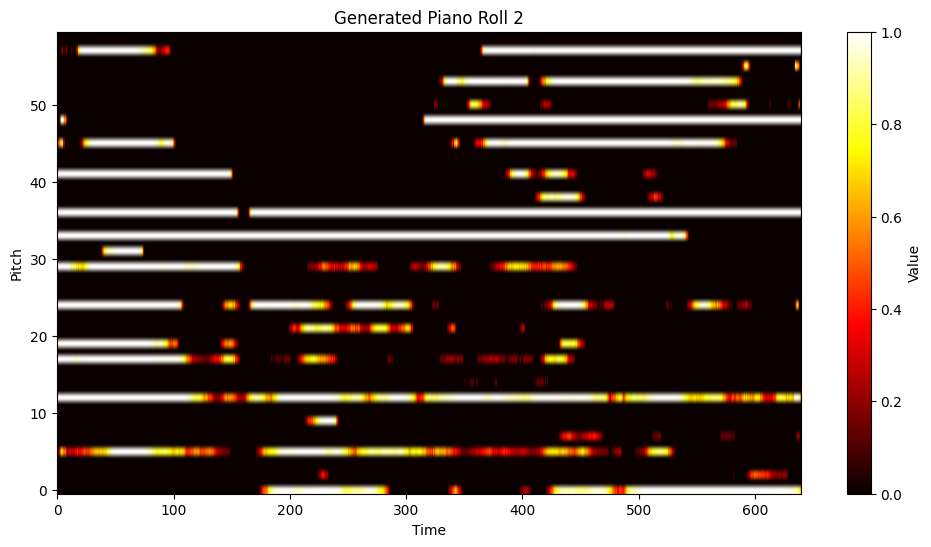

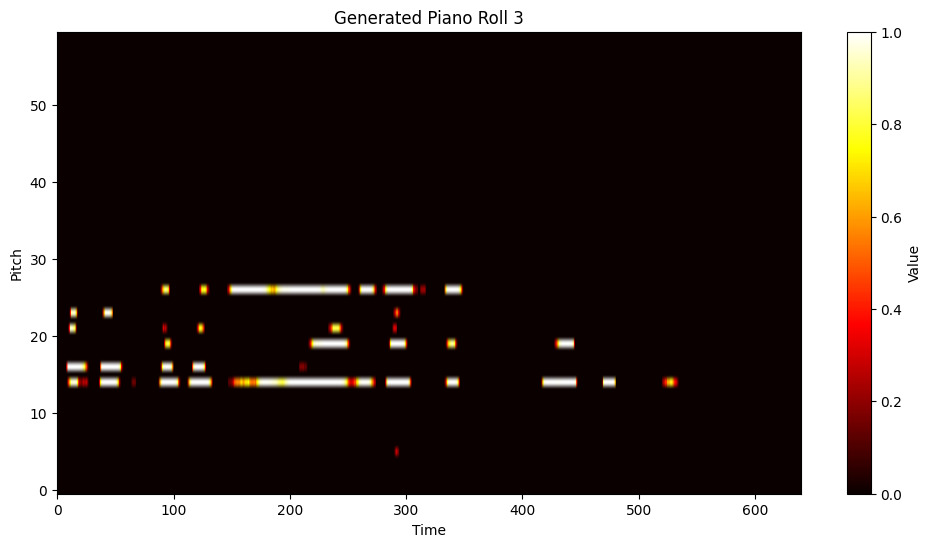

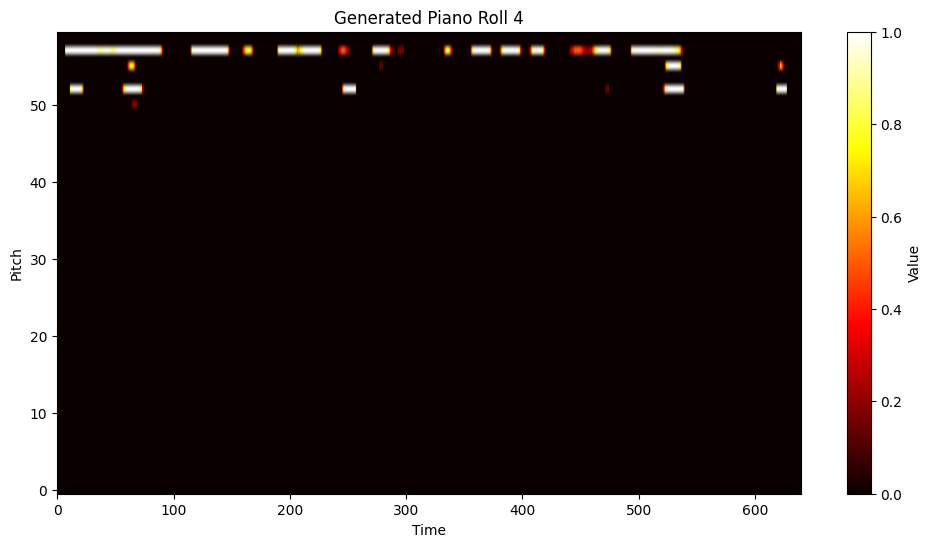

...

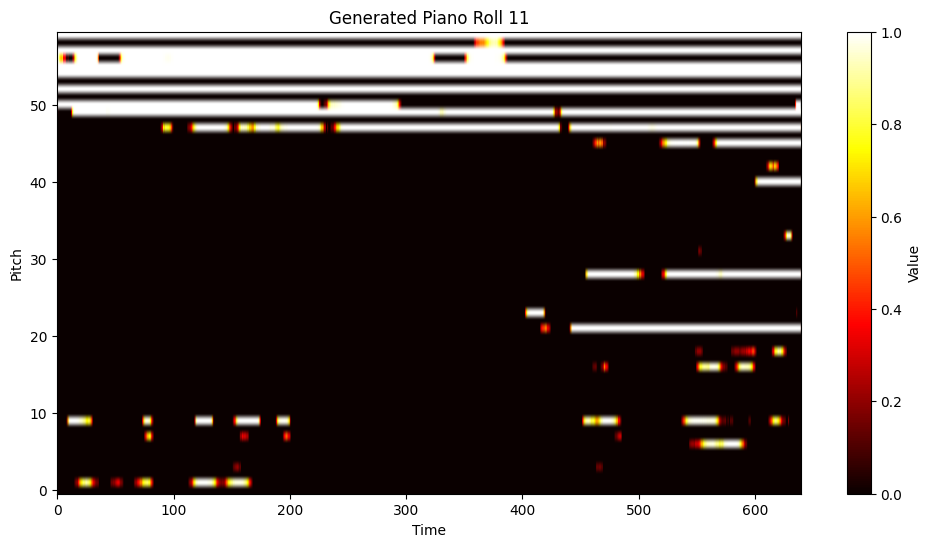

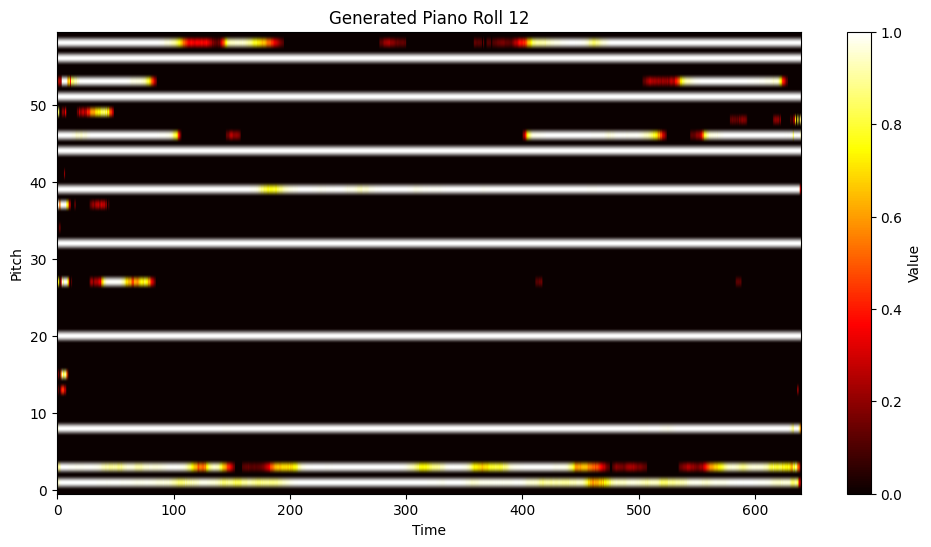

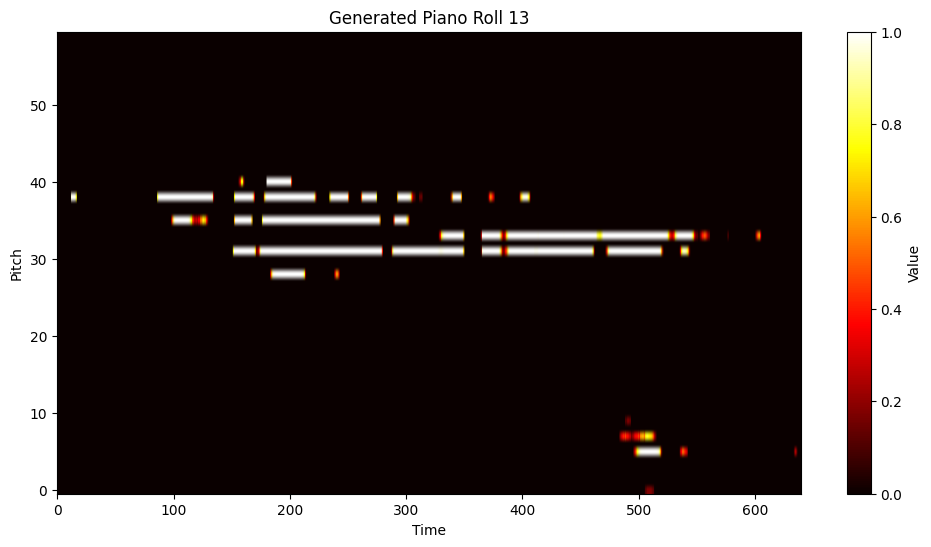

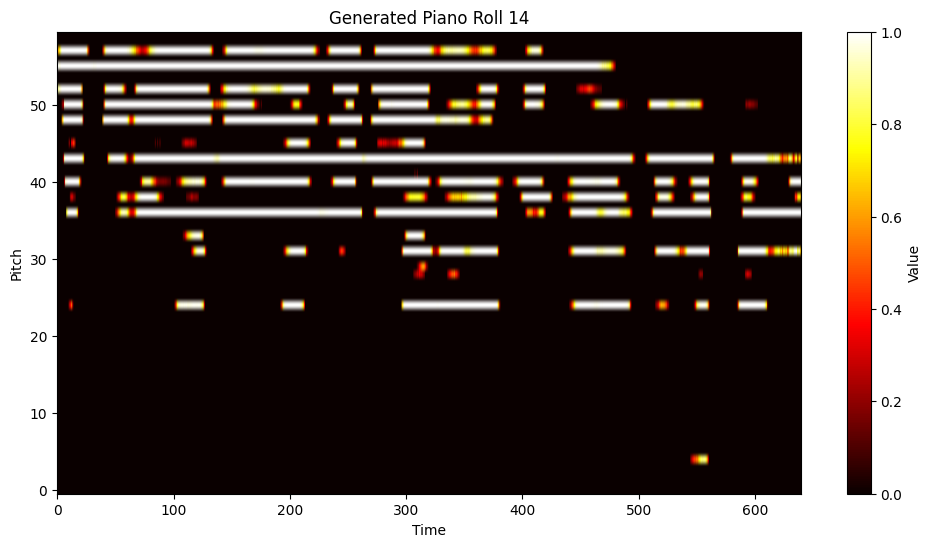

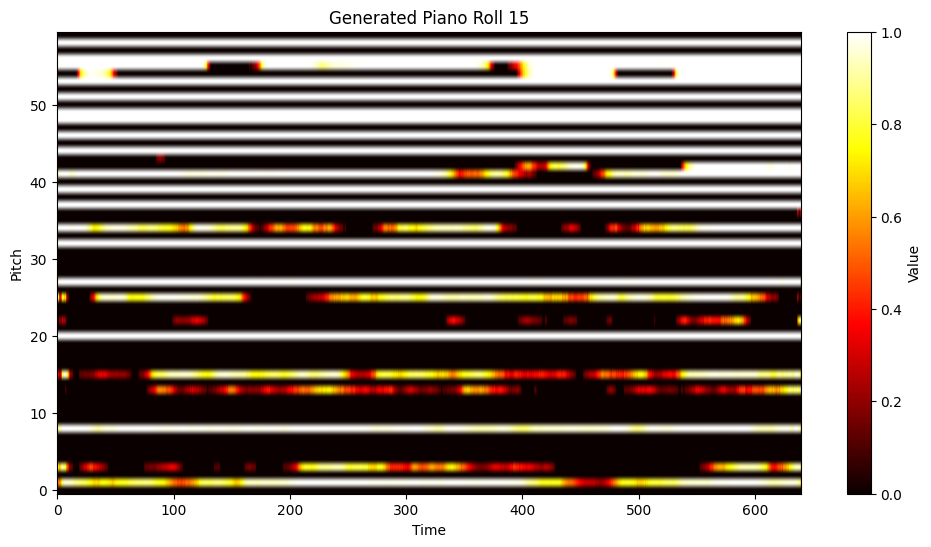

In [120]:
with torch.no_grad():
    z = ddpm.sample(batch_size=16, device='cuda')
    piano_rolls = vae_model.decode(z)  # (16, *piano_roll_shape)

piano_rolls = piano_rolls.squeeze(1).cpu().numpy()  # Remove channel dimension
piano_rolls = np.where(piano_rolls < 0.1, 0, piano_rolls)  # Thresholding
print("Generated piano rolls shape:", piano_rolls.shape)

for i, piano_roll in enumerate(piano_rolls):
    plt.figure(figsize=(12, 6))
    plt.imshow(piano_roll.T, aspect='auto', origin='lower', cmap='hot')
    plt.colorbar(label='Value')
    plt.title(f'Generated Piano Roll {i}')
    plt.xlabel('Time')
    plt.ylabel('Pitch')
    plt.show()

In [121]:
for i, piano_roll in enumerate(piano_rolls):
    piano_roll_to_pretty_midi(
        torch.tensor(piano_roll), 
        path=f"data/generated_piano_roll_{i}.mid"
    )
    
    midi_data = pretty_midi.PrettyMIDI(f"data/generated_piano_roll_{i}.mid")
    audio_data = midi_data.fluidsynth()
    write(f"data/generated_audio_{i}.wav", 44100, audio_data.astype(np.float32))
    
    print(f"Generated MIDI {i} with {len(midi_data.instruments[0].notes)} notes.")
    IPython.display.Audio(f"data/generated_audio_{i}.wav")

Instrument with 122 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
Generated MIDI 0 with 122 notes.
Instrument with 147 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
Generated MIDI 1 with 147 notes.
Instrument with 95 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
Generated MIDI 2 with 95 notes.
Instrument with 37 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
Generated MIDI 3 with 37 notes.
Instrument with 24 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
Generated MIDI 4 with 24 notes.
Instrument with 60 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
Generated MIDI 5 with 60 notes.
Instrument with 108 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
Generated MIDI 6 with 108 notes.
Instrument with 100 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
Generated MIDI 7 with 100 notes.
Instrument with 127 notes added to PrettyMIDI object.
Instuments in MIDI: ['']
Generated MIDI 8 with 127 notes.


In [119]:
IPython.display.Audio("data/generated_audio_0.wav")